# Opensea forgalom alakulása 2021. augusztus, szeptember
Legelső és legnehezebb feladat volt a szükséges adatok begyűjtése a megfelelő formátumban. Ehhez első körben az etherscan.io weboldaláról próbáltunk letölteni CSV export formájában fájlokat, de a hatalmas mennyiségű tranzakció és a kis mennyiségű export korlátnak (5000 sor max.) köszönhetően bármelyik napról körülbelül az első 4-5 óra forgalmát tudtuk csak kiexportálni, amely nem volt megfelelő minőségű és mennyiségű adat a feladatunkhoz.

### Opensea contract address megszerzése
Az etherscan oldalán, amely az ethereum mainnet block explorer weboldala minden nagy exchange, marketplace contract adresse nyilvánosan meg van jelölve, így könnyen megtalálható:
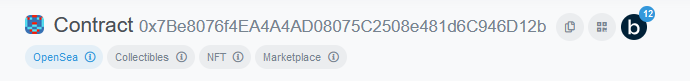

### Etherscan API
Ezután rátaláltunk az Etherscan API-ra, amelynek a dokumentációját alaposan áttanulmányozva sikerült megtalálnunk a számunkra megfelelő API endpointot. Generáltunk egy API kulcsot, amellyel naponta 100.000 kérést lehet végrehajtani, ez teljes mértékben elegendő volt ahhoz, hogy a szükséges adatok begyűjtsük.

Ugyanakkor itt is voltak bizonyos korlátozások, mint pl. a számunkra szükséges API egy hívásban maximum 10.000 rekordot adott vissza. A lenti képen látható, hogy pontosan hogyan is lehet elérni Postman-ből a az etherscan api megfelelő endpointját:
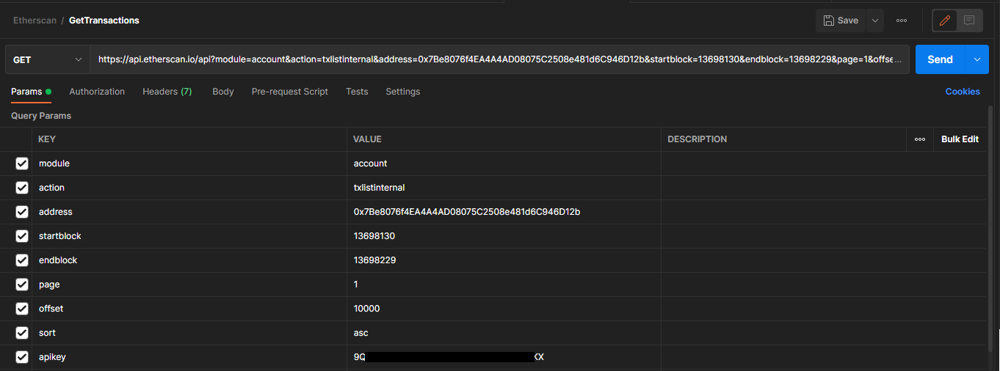

A fenti képről számunkra a legfontosabb paraméter a start és az endblock volt. A fenti hívásban az OpenSea contract-hoz tartozó 13698130 és 13698229 blokkok közötti intervallumban tárol tranzakciók kérhetők le. A visszakapott adatok között pedig egy lista a következő objektumokkal:
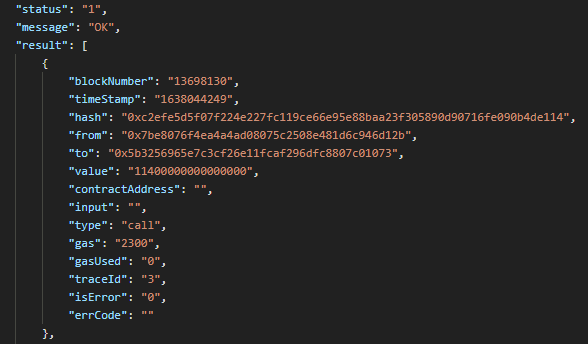

### Etherscan API Wrapper
Ezután csupán egy Wrapper alkalamazást kellett írnunk, amely egy ciklus segítségével az adatokat lekéri, listába rendezi és egy csv fájlba elmenti a további feldolgozáshoz. Az Wrapper alkalmazás C# nyelven került megírásra, forráskódja a megadott git repoban található:
https://github.com/rcspepe/BigData-SEA/tree/master/Etherscan

Ezzel az alkalmazással bármelyik hónapra lekérdezhető bármilyen ETH alapú tárcához tartozó összes tranzakció, csupán meg kell keresni az adott hónap első blokkját a mainnet-en.

#### Mire kellett figyelni?
Meg kellett keresnünk az aktuális hónap első blokkját, majd megtalálni azt a blokkmennyiséget, amellyel egyik kérés tranzakciószáma sem megy 10000 fölé, mert úgy hiányos lesz a mintánk.
Az augusztusi első blokk a 12935812-es blokk, augusztus elsején éjfél után 14 másodperccel jött létre. A szeptemberi első blokk pedig a 13135896-es blokk. A megfelelő tartomány, amelyet több ciklus után sikerült beállítani végül 250 lett, amely egyik hónapban sem lépi túl a 10000 tranzakciót. Az adatgyűjtésért felelős ciklus pedig a következő:
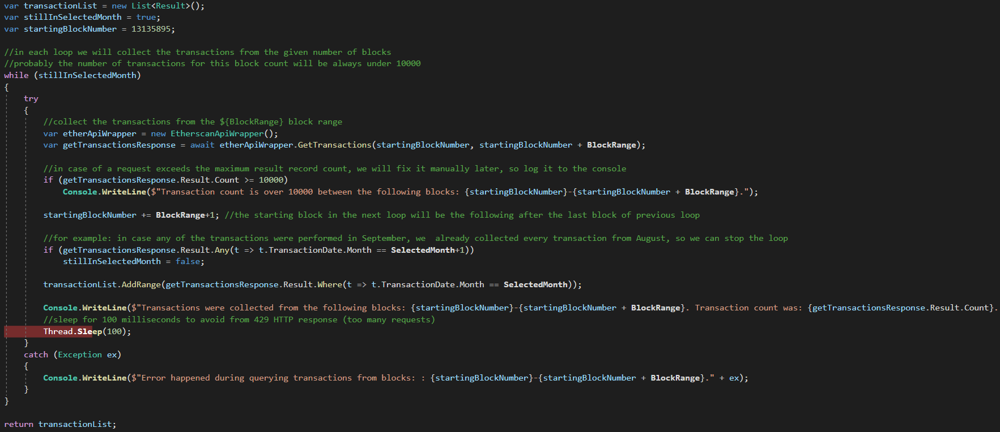

#### Így kaptuk meg a szükséges adatfájlokat, amelyeket a lentiekben hivatkozunk

A kapott csv fájlból parq fájlokat generáltunk a következő python script-tel: https://github.com/rcspepe/BigData-SEA/blob/master/parq.py

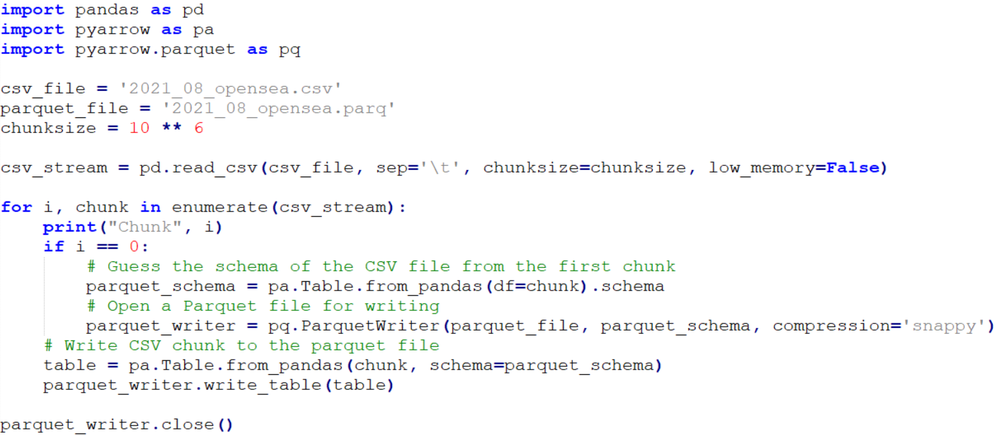

### Szükséges osztálykönyvtárak behivatkozása, valamint a parq fájl beolvasása dataframe-be
A bemutatott és hivatkozott wrapperrel bármely hónapra lekérhető a szükséges tranzakciólista, ugyanakkor a konkrét parq fájlok itt is elérhetőek a vizsgált 2 hónapra: https://drive.google.com/drive/folders/1wgndRrTIiey2IAOoGkv8U0evobvmUfcK?usp=sharing

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
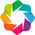

In [40]:
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq
from pandas_profiling import ProfileReport
import holoviews as hv
import holoviews.operation.datashader as hd
from holoviews.operation.datashader import rasterize
import matplotlib.pyplot as plt

from bokeh.plotting import show
hv.extension('bokeh','matplotlib')
df = pd.read_parquet("2021_08_opensea.parq")

## Adatkonverziók, adattisztítás
A következő blokkban a beolvasott dataframe-en elvégezzük a szükséges adattisztításokat, valamint adatkonverziókat. Az etherscan-től kapott adatokban minden tranzakció két rekordként jelent meg, mivel minden eladás esetén, bizonyos díj az opensea-t illette, így az eladási ár egy bizonyos százaléka az opensea külön tárcájába kerül leutalásra, míg a másik része az eladót illette. Tehát minden tranzakció 2 sorban jelent meg, de a második sorból csak a leutalt összeg volt érdekes számunkra, így a duplikációkat eldobtuk és a hash alapján csoportosítottuk az adatokat és 3 oszlopot alakítottunk ki: egy eladói díjat, egy opensea díjat és egy összesített eladási árat, amely az opensea felületén megjelent az eladás előtt.
A trace id oszlop azt volt hivatott jelölni, hogy a tranzakció melyik része került leutalásra a felhasználónak és melyik az opensea tárcának, de ebben találtunk hibákat (nagyon ritka esetekben, de torzította az adatokat) ezért a to oszlop alapján végeztük el a csoportosítást, mivel az Opensea jutalék tárcájának a címe minden esetben fix.

In [41]:
df['SellerReward(Eth)'].apply(pd.to_numeric)
amounts = pd.DataFrame()
df['3'] = df['SellerReward(Eth)'][df['To'] != '0x5b3256965e7c3cf26e11fcaf296dfc8807c01073']
df['4'] = df['SellerReward(Eth)'][df['To'] == '0x5b3256965e7c3cf26e11fcaf296dfc8807c01073']
transactions = df.groupby('Hash')
amounts['Total_value'] = transactions['SellerReward(Eth)'].sum()
amounts['Seller_value'] = transactions['3'].sum()
amounts['Commission_value'] = transactions['4'].sum()
df = pd.merge(df, amounts, on='Hash', how='left')
df.drop_duplicates(subset='Hash', keep='last', inplace=True)
df.drop(['TraceId', 'SellerReward(Eth)', '3', '4'], axis=1, inplace=True)
df.Date = pd.to_datetime(df.Date)
print('Transactions comission sum: ')
print(df['Commission_value'].sum())
print('Transactions seller reward sum: ')
print(df['Seller_value'].sum())

Transactions comission sum: 
70295.25663224234
Transactions seller reward sum: 
955573.7965251651


## EDA Augusztus
Az adatforrás teljes volt, hiányzó értékek nem voltak.
1607483 db tranzakció történt augusztus folyamán, szinte az összes nap minden percében történt eladás. Az átlagos eladási érték 0.63 (2-3000 dollár közötti fiat valuta érték augusztusi árfolyamon számolva) ETH volt, az Opensea a tranzakciókból átlagosan 0.043 ETH-t (100-200 dollár közötti érték augusztusi árfolyamon számolva) zsebelt be. 
Az Opensea augusztus folyamán 70295 ETH jutalékot gyűjtött az áruházukban történt eladások után, ami augusztusi árfolyamon ~210 millió dollár.

A maximális jutalék, amelyet egy ETH eladás után kapott az Opensea, az 77.7 ETH (több mint 250000 dollár) volt:
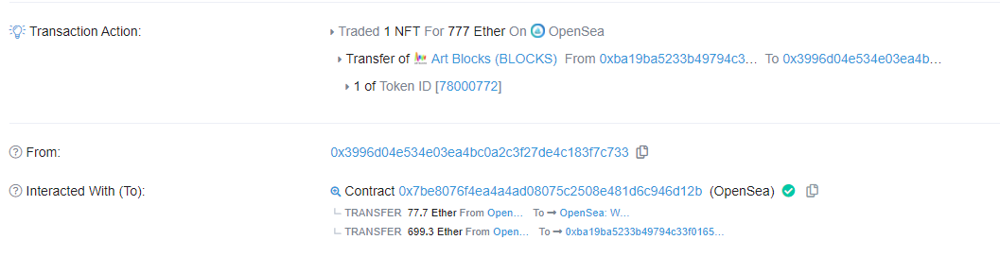

A legnagyobb tranzakció egy 2275 ETH értékű eladás volt, amely az adott napi árfolyamon közel 7 millió dollárnak felelt meg:

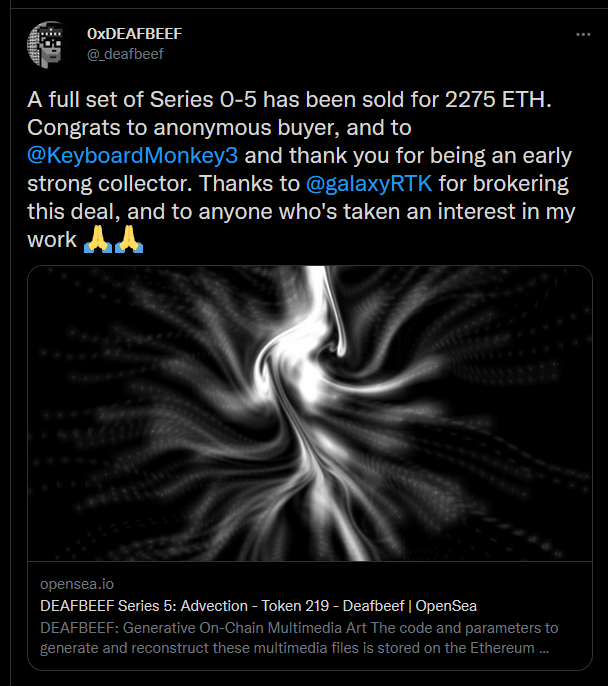
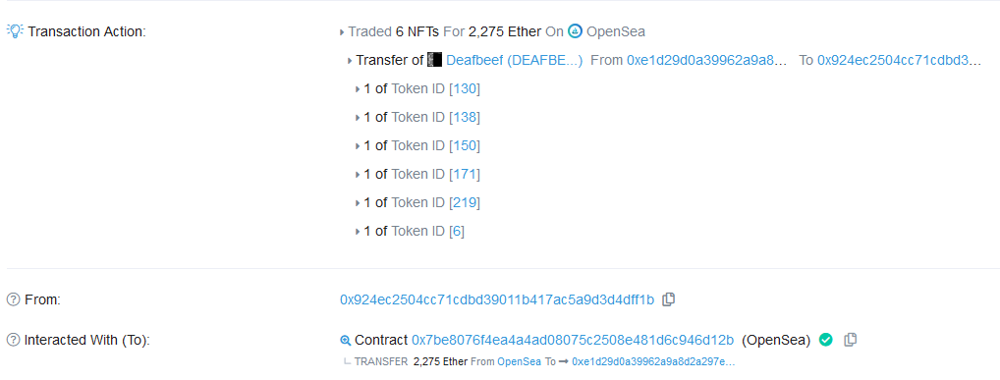

Kiugró érték, hogy az alábbi tárca: 0xefe708e6dd941e29965f34f4c5c6e78f0ebe3f5b több mint 20ezer esetben adott el az Opensea-n augusztus folyamán, ami hihetetlennek tűnik (de igaz, etherscan profil alapján ellenőrízhető), kicsit jobban utána nézve, ez előfizetés vásárlás volt az OpenSea Storefront funkcióhoz, amely egy bizonyos díj ellenében igényelhető, és a tárcában lévő NFT igazolja, hogy a felhasználónak van hozzáférése.

177284 blokkra került Opensea tranzakció augusztus folyamán, a minimum maximum értékekből kiszámolható, hogy összesen 200083 blokk készült, tehát a blokkok 88,6%-a tartalmazott legalább 1 db opensea tranzakciót.

In [21]:
df_eda = df.drop(['Hash'], axis=1)
df_eda.Date = pd.to_datetime(df_eda.Date)

profile = ProfileReport(df_eda, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## Vizualizáció Augusztus (heatmap)
#### Adatredukció
Az eddig használt dataframe-en elvégeztünk egy csoportosítást, amely óránkénti bontásban csoportosítja a tranzakciókat, ezután pedig a 2 további oszlopot adunk a heatmapen való tökéletes megjelenítéshez.

In [22]:
financial = df.drop(['BlockNumber', 'Hash', 'To'], axis=1)
financial.Date = pd.to_datetime(financial.Date)


daily = financial.groupby(financial.Date.dt.floor('D')).sum()
daily['Day'] = daily.index.day
daily['Count'] = financial.groupby(financial.Date.dt.floor('D'))['Total_value'].count()
hourly = financial.groupby(financial.Date.dt.floor('H')).sum()
hourly['Day'] = hourly.index.day
hourly['Hour'] = hourly.index.hour
hourly['Count'] = financial.groupby(financial.Date.dt.floor('H'))['Total_value'].count()

hour_day = hv.HeatMap(hourly[['Day', 'Hour', 'Total_value']])
hour_day.opts(width=500, height=500, title='Day/Hour Volume')
show(hv.render(hour_day))
hour_day_count = hv.HeatMap(hourly[['Day', 'Hour', 'Count']])
hour_day_count.opts(width=500, height=500, title='Day/Hour Counts')
show(hv.render(hour_day_count))

### Heatmap érdekességek
Az első, tranzakciók összegére készült heatmap-en látható, hogy augusztus folyamán az első húsz napban nem voltak kifejezetten kiugró napok vagy órak, átlagos mederben folyt a kereskedés, viszont augusztus 20-a után az átlagos napi forgalom is nőtt (tranzakciószám), de sokkal nagyobb mértékben növekedett a tranzakciók értéke, továbbá voltak órak, ahol nagyon magas értékű tranzakciók zajlottak.
Ilyen például az augusztus 29-e, hajnali 4 és 5 óra között időszak, amely az egész összeg alapú heatmap talán legsötétebb cellája. Kicsit visszanézve a történéseket, az alábbiakat találtuk:
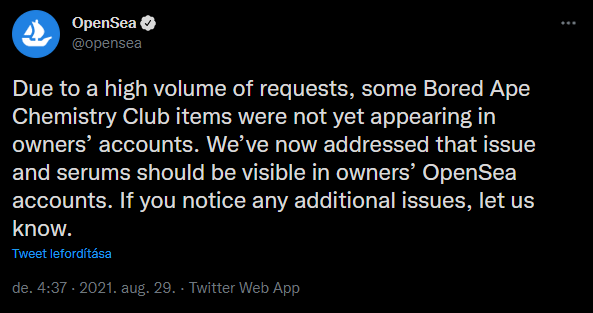
Akkora mennyiségű és mértűkű tranzakció zudúlt az Opensea-re ebben az időszakban, hogy hibákkal is szembe kellet néznie az Opensea fejlesztői csapatának.

In [23]:
daily = financial.groupby(financial.Date.dt.floor('d')).sum()
daily['Day'] = daily.index.day

daily_volume = hv.Bars(daily[['Day', 'Total_value']])
daily_volume.opts(width=500, height=500, title='Daily volume')
show(hv.render(daily_volume))

A napi forgalmat kiplotolva, látató, hogy szignifikáns növekedés következett be auguszutus folyamán. És ezt a következő kimutatás is nagyon jól igazolja. Ahogy az oszlopdiagram is mutatja, a heatmap-ről jól látható, hogy kereskedési volumenben augusztus 29-e volt a legaktívabb, 
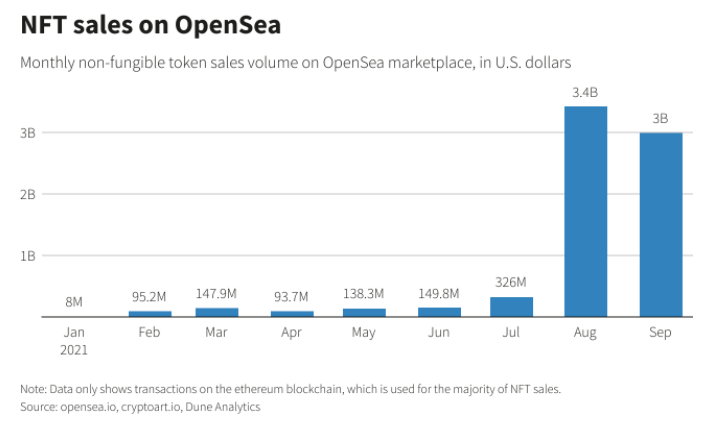

In [29]:
df_sept = pd.read_parquet("2021_09_opensea.parq")
df_sept['SellerReward(Eth)'].apply(pd.to_numeric)
amounts_sept = pd.DataFrame()
df_sept['3'] = df_sept['SellerReward(Eth)'][df_sept['To'] != '0x5b3256965e7c3cf26e11fcaf296dfc8807c01073']
df_sept['4'] = df_sept['SellerReward(Eth)'][df_sept['To'] == '0x5b3256965e7c3cf26e11fcaf296dfc8807c01073']
transactions_sept = df_sept.groupby('Hash')
amounts_sept['Total_value'] = transactions_sept['SellerReward(Eth)'].sum()
amounts_sept['Seller_value'] = transactions_sept['3'].sum()
amounts_sept['Commission_value'] = transactions_sept['4'].sum()
df_sept = pd.merge(df_sept, amounts_sept, on='Hash', how='left')
df_sept.drop_duplicates(subset='Hash', keep='last', inplace=True)
df_sept.drop(['TraceId', 'SellerReward(Eth)', '3', '4'], axis=1, inplace=True)
df_sept.Date = pd.to_datetime(df_sept.Date)

## EDA Szeptember
Az adatforrásunk szeptemberre is teljesen tökéletes volt, nem voltak hiányzó értékek. Szeptember folyamán 1631492 NFT tranzakció került végrehajtásra, amely kicsivel több mint az augusztusi mennyiség.
Az átlagos eladási érték 0.49 (1.5-2000 dollár közötti fiat valuta érték szeptemberi árfolyamon számolva) ETH volt, az Opensea a tranzakciókból átlagosan 0.034 ETH-t (100-150 dollár közötti érték szeptemberi árfolyamon számolva) zsebelt be. Mindkét érték valamivel alacsonyabb mint az augusztusi időszakra vonatkozó. A maximális jutalék, amelyet egy ETH eladás után kapott az Opensea, az 95 ETH (közel 300000 dollár) volt:

A legnagyobb tranzakció egy 950 ETH értékű eladás volt, amely bőven elmarad az augusztusi maximumtól, ugyanakkor az adott napi árfolyamon 2,8 millió dollárnak felelt meg. És ezt csupán 1 db NFT-ért fizették, a szeptemberivel ellentétben, ahol egy teljes kollekciót vettek:
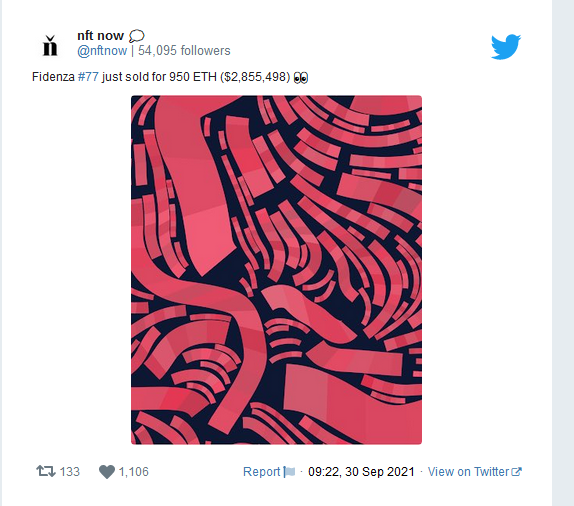
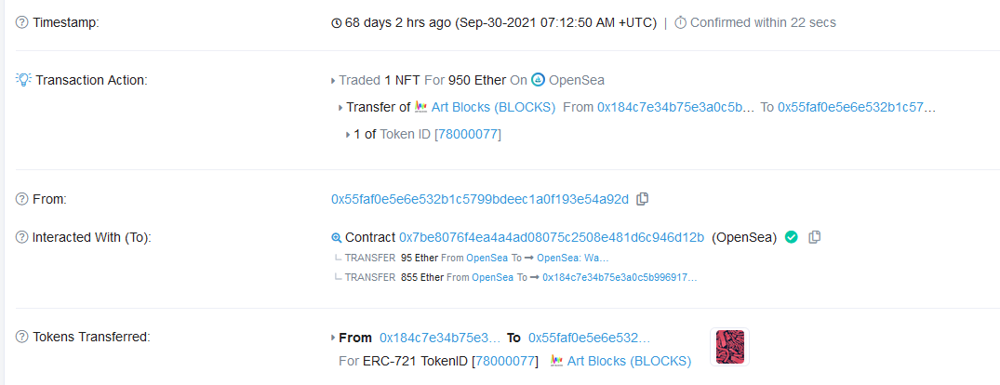

In [30]:
df_sept_eda = df_sept.drop(['Hash'], axis=1)
df_sept_eda.Date = pd.to_datetime(df_sept_eda.Date)

profile = ProfileReport(df_sept_eda, title="Pandas Profiling Report", explorative=True)
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [32]:
financial_sept = df_sept.drop(['BlockNumber', 'Hash', 'To'], axis=1)
financial_sept.Date = pd.to_datetime(financial_sept.Date)


daily_sept = financial_sept.groupby(financial_sept.Date.dt.floor('D')).sum()
daily_sept['Day'] = daily_sept.index.day
daily_sept['Count'] = financial_sept.groupby(financial_sept.Date.dt.floor('D'))['Total_value'].count()
hourly_sept = financial_sept.groupby(financial_sept.Date.dt.floor('H')).sum()
hourly_sept['Day'] = hourly_sept.index.day
hourly_sept['Hour'] = hourly_sept.index.hour
hourly_sept['Count'] = financial_sept.groupby(financial_sept.Date.dt.floor('H'))['Total_value'].count()

hour_day_sept = hv.HeatMap(hourly_sept[['Day', 'Hour', 'Total_value']])
hour_day_sept.opts(width=500, height=500, title='Day/Hour Volume')
show(hv.render(hour_day_sept))
hour_day_sept_count = hv.HeatMap(hourly_sept[['Day', 'Hour', 'Count']])
hour_day_sept_count.opts(width=500, height=500, title='Day/Hour Counts')
show(hv.render(hour_day_sept_count))

In [42]:
daily_sept = financial_sept.groupby(financial_sept.Date.dt.floor('d')).sum()
daily_sept['Day'] = daily_sept.index.day

daily_volume_sept = hv.Bars(daily_sept[['Day', 'Total_value']])
daily_volume_sept.opts(width=500, height=500, title='Daily volume')
show(hv.render(daily_volume_sept))